<a href="https://colab.research.google.com/github/rizkyyfaauzi21/PCVK_Ganjil_2024/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [15]:
from google.colab import drive

# Accessing My Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


 Mengubah tingkat kecerahan citra 
----------------------------------
Masukkan nilai kecerahan: 50


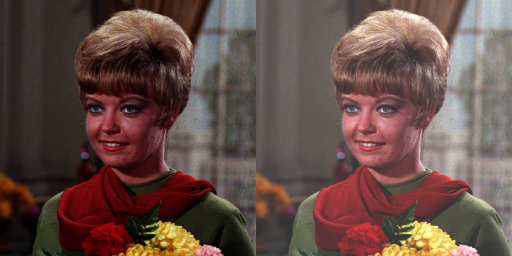

In [19]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

print(' Mengubah tingkat kecerahan citra ')
print('----------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/female.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

# akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

# cara simple tanpa for loop
# brightness_image = cv.convertScaleAbs(original, beta-brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

# TUGAS PRAKTIKUM

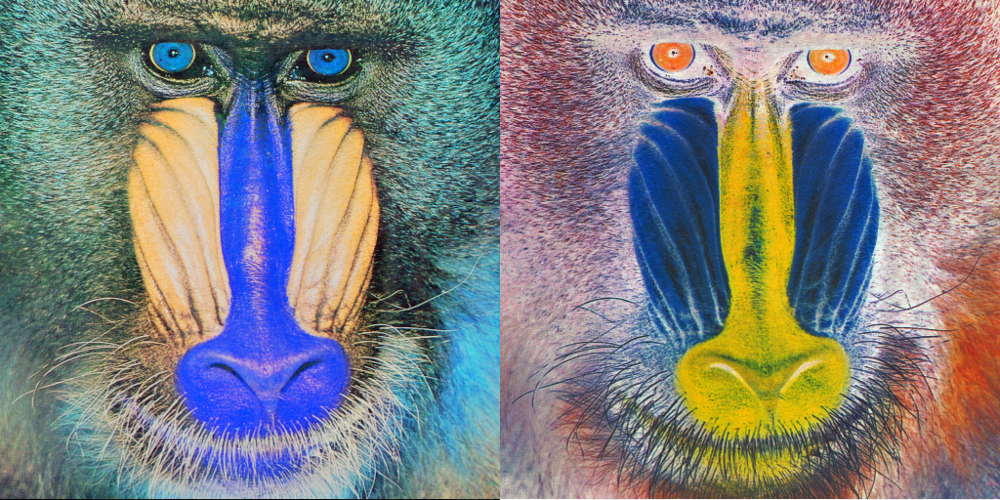

In [26]:
original = cv.imread('/content/drive/MyDrive/PCVK/monyet.tiff')
inverted_img = np.zeros(original.shape, original.dtype)

for x in range(original.shape[0]):
  for y in range(original.shape[1]):
    for z in range(original.shape[2]):
      inverted_img[x,y,z] = np.clip(255 - original[x,y,z], 0, 255)

final_frame = cv.hconcat((original, inverted_img))
cv2_imshow(final_frame)

Mengubah kontras dan tingkat kecerahan citra
--------------------------------
Masukkan nilai kecerahan [-255 - 255]: 50
Masukkan nilai kontras [1.0 - 3.0]: 2


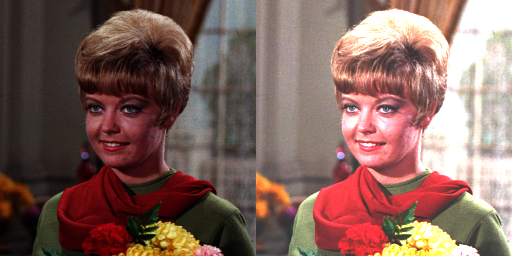

In [28]:
print('Mengubah kontras dan tingkat kecerahan citra')
print('--------------------------------')

try:
    brightness = int(input('Masukkan nilai kecerahan [-255 - 255]: '))
    contrast = int(input('Masukkan nilai kontras [1.0 - 3.0]: '))
except ValueError:
    print('Error, not a number')

female_img = cv.imread('/content/drive/MyDrive/PCVK/female.tiff')
contrast_brightness = np.zeros(female_img.shape, female_img.dtype)

for x in range(female_img.shape[0]):
  for y in range(female_img.shape[1]):
    for z in range(female_img.shape[2]):
      contrast_brightness[x,y,z] = np.clip(contrast * female_img[x,y,z] + brightness, 0, 255)


final_frame = cv.hconcat((female_img, contrast_brightness))
cv2_imshow(final_frame)

Mengubah kontras dan tingkat kecerahan citra
--------------------------------
Masukkan nilai kecerahan : 50


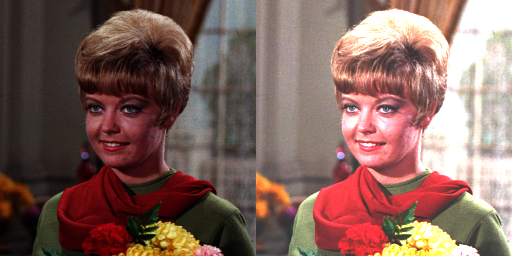

In [29]:
print('Mengubah kontras dan tingkat kecerahan citra')
print('--------------------------------')

try:
    brightness = int(input('Masukkan nilai kecerahan : '))
except ValueError:
    print('Error, not a number')

female_img = cv.imread('/content/drive/MyDrive/PCVK/female.tiff')
log_brightness = np.zeros(female_img.shape, female_img.dtype)

for x in range(female_img.shape[0]):
  for y in range(female_img.shape[1]):
    for z in range(female_img.shape[2]):
      log_brightness[x,y,z] = np.clip(brightness * np.log(1 + female_img[x,y,z]), 0, 255)



final_frame = cv.hconcat((female_img, contrast_brightness))
cv2_imshow(final_frame)

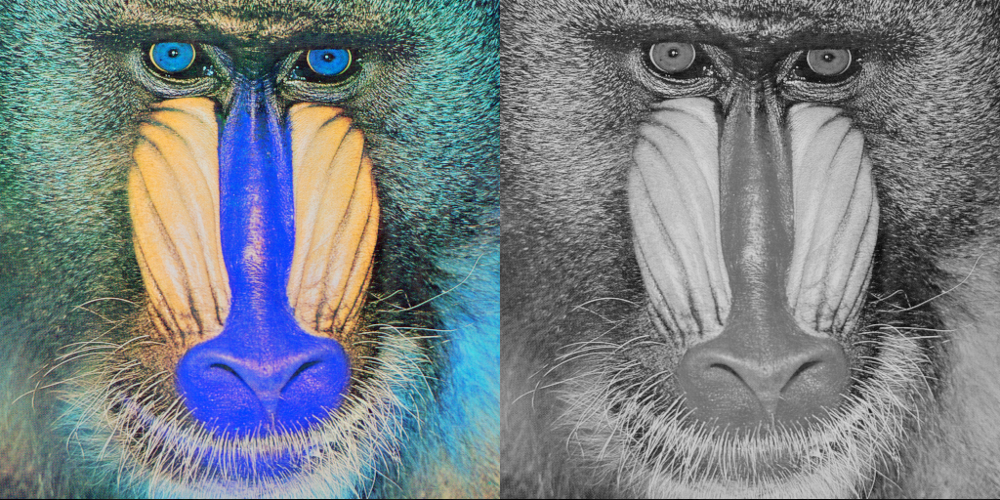

In [30]:
monyet_img = np.zeros((original.shape[0], original.shape[1], 3), original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    R = int(original[y, x, 0])
    G = int(original[y, x, 1])
    B = int(original[y, x, 2])
    gray = int((R + G + B) / 3)
    monyet_img[y, x] = gray

final_frame = cv.hconcat((original, monyet_img))
cv2_imshow(final_frame)

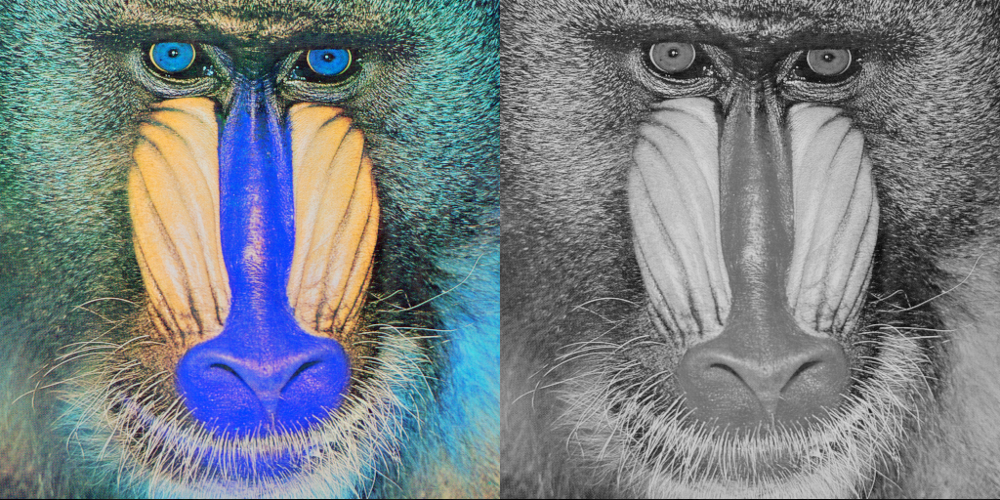

In [33]:
# AVERANGING

Amonyet_img = np.zeros((original.shape[0], original.shape[1], 3), original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    R = int(original[y, x, 0])
    G = int(original[y, x, 1])
    B = int(original[y, x, 2])
    gray = int((R + G + B) / 3)
    Amonyet_img[y, x] = gray

final_frame = cv.hconcat((original, Amonyet_img))
cv2_imshow(final_frame)

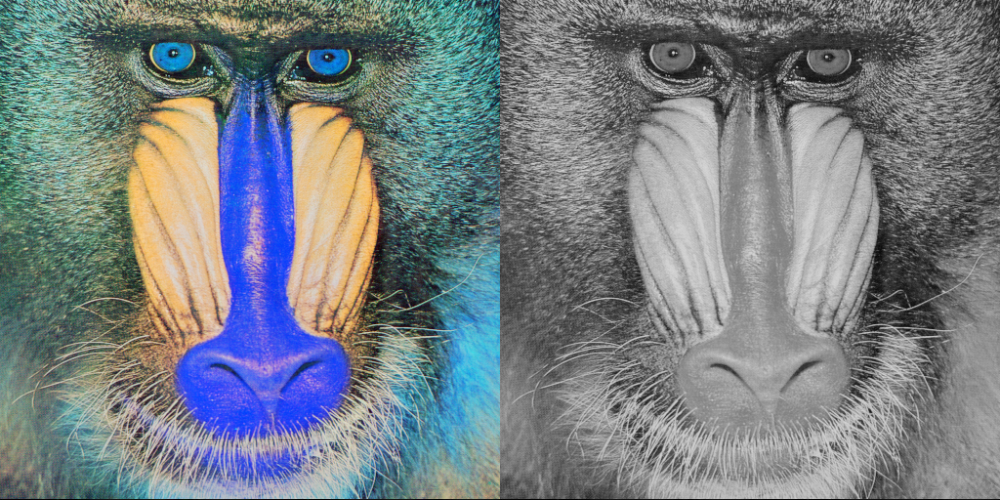

In [34]:
# LIGHTNESS

LSmonyet_img = np.zeros((original.shape[0], original.shape[1], 3), original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    R = int(original[y, x, 0])
    G = int(original[y, x, 1])
    B = int(original[y, x, 2])
    gray = int(((np.max([R, G, B]) + np.min([R, G, B])) / 2))
    LSmonyet_img[y, x] = gray

final_frame = cv.hconcat((original, LSmonyet_img))
cv2_imshow(final_frame)

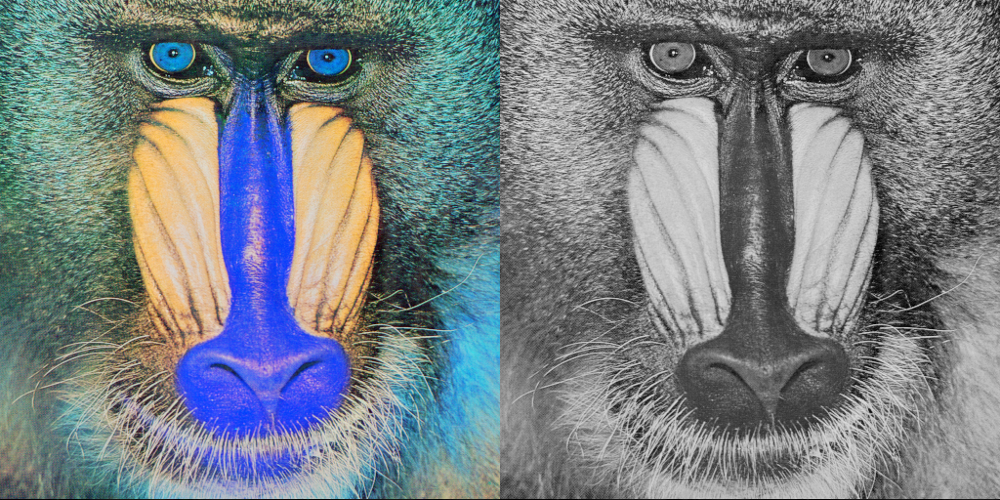

In [35]:
# LUMINANCE

Lmonyet_img = np.zeros((original.shape[0], original.shape[1], 3), original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    Lmonyet_img[y, x] = np.clip(0.07 * original[y,x,2] + 0.72 * original[y,x,1] + 0.21 * original[y,x,1], 0, 255)

final_frame = cv.hconcat((original, Lmonyet_img))
cv2_imshow(final_frame)

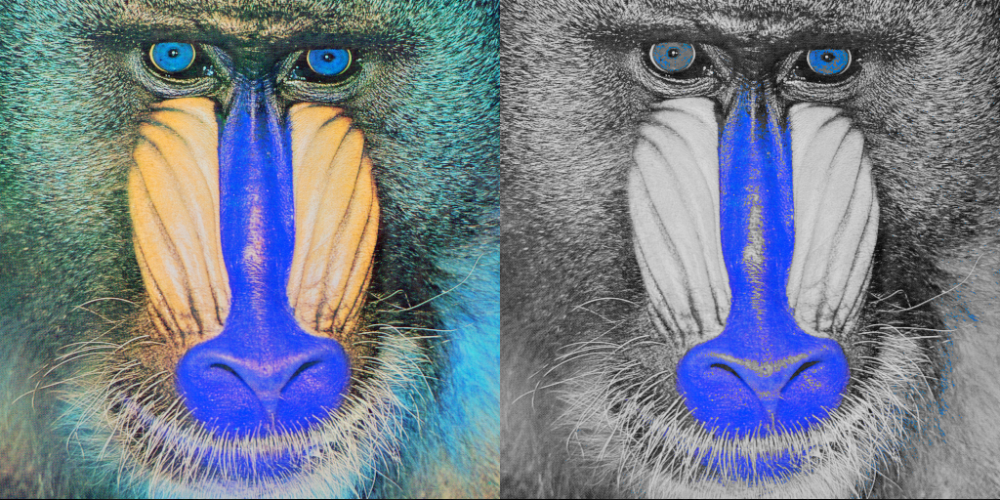

In [36]:
# Percobaan 1
# Initialize an empty array for the blue mask image
blue_mask_img = np.zeros(original.shape, original.dtype)

# Iterate over each pixel in the image
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        b, g, r = original[y, x]  # OpenCV reads images in BGR format

        # Check for non-blue regions
        if r > 124 or g > 124 or b < 150:
            # Convert non-blue areas to grayscale using the luminance method
            gray = int(0.299 * r + 0.587 * g + 0.114 * b)
            blue_mask_img[y, x] = [gray, gray, gray]
        else:
            # Preserve blue areas
            blue_mask_img[y, x] = [b, g, r]

# Concatenate the original and the masked image side by side
final_frame = cv.hconcat((original, blue_mask_img))

# Display the final image
cv2_imshow(final_frame)

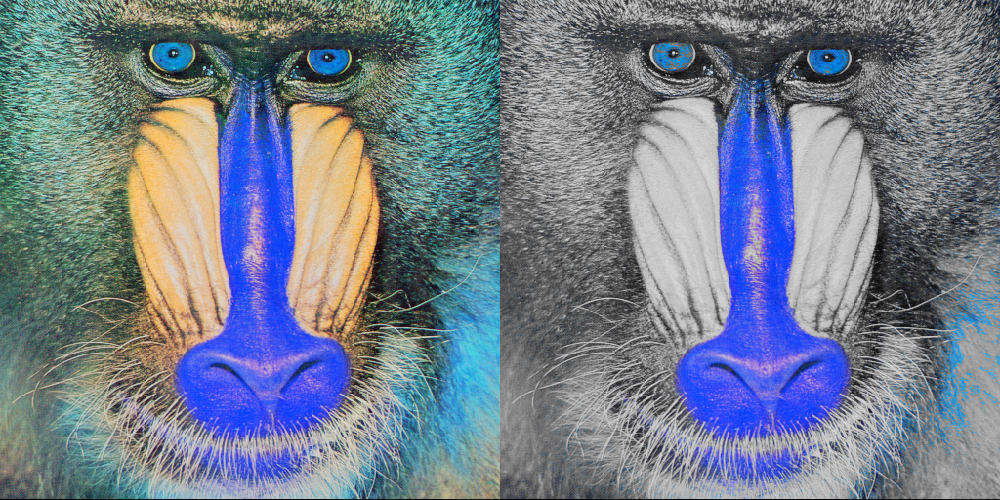

In [37]:
# Percobaan 2
# Convert the input image from BGR to HSV color space
hsv_img = cv.cvtColor(original, cv.COLOR_BGR2HSV)

# Define the lower and upper range of blue color in HSV
lower_blue = np.array([100, 50, 50])
upper_blue = np.array([140, 255, 255])

# Create a mask for the blue color using the defined range
blue_mask = cv.inRange(hsv_img, lower_blue, upper_blue)

# Initialize an empty array for the blue mask image
blue_mask_img = np.zeros(original.shape, original.dtype)

# Iterate over each pixel in the image
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        b, g, r = original[y, x]  # OpenCV reads images in BGR format

        # Check if the pixel is in the blue mask
        if blue_mask[y, x] > 0:
            # Preserve blue areas
            blue_mask_img[y, x] = [b, g, r]
        else:
            # Convert non-blue areas to grayscale using the luminance method
            gray = int(0.299 * r + 0.587 * g + 0.114 * b)
            blue_mask_img[y, x] = [gray, gray, gray]

# Concatenate the original and the masked image side by side
final_frame = cv.hconcat((original, blue_mask_img))

# Display the final image
cv2_imshow(final_frame)